## **Mount Drive (When Using Google Colab)**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd gdrive/My Drive/NeuriteOutgrowth

Mounted at /content/gdrive
/content/gdrive/My Drive/NeuriteOutgrowth


#  **Computer Vision Demo**

A quick intro to using the repo for neurite semantic segmenatation, nuclei instance segmentation and graph representation of the cell culture. 

**Dont forget (!!!) to download the [Mask RCNN weights](https://drive.google.com/file/d/1sX5u0dEBvA8Y8z8UObXsty-CE_TjWNKH/view?usp=sharing) and place them in the repository root directory  ("NeuriteOutgrowth" folder)**


**Set NeuriteOutgrowth as root directory**

In [2]:
import os
import sys

# Set NeuriteOutgrowth folder as root directory of the project
current_dir = os.getcwd()
last_folder_in_dir = os.path.basename(os.path.normpath(current_dir))
assert last_folder_in_dir == "NeuriteOutgrowth", "you need to set NeuriteOutgrowth as root dir"
ROOT_DIR = current_dir

# Import repo
sys.path.append(ROOT_DIR)  # To find local version of the library

**Indicate the position of the two h5 files (models and weights) download Mask RCNN weights if needed**

In [24]:
# Local path to trained model h5 file (assuming they were saved on root directory)
neurite_segmentation_model_path = os.path.join(ROOT_DIR, "neurite_unet_weights.h5")
assert os.path.exists(neurite_segmentation_model_path), "please download neurite_unet_weights.h5 file into ROOT_DIR"

# Local path to trained weights h5 file (assuming they were saved on root directory)
mask_rcnn_weights_path = os.path.join(ROOT_DIR, "deepretina_final.h5")
assert os.path.exists(mask_rcnn_weights_path), "please download deepretina_final.h5 file (Mask RCNN weights)  into ROOT_DIR"

## **Modifications for Google Colab Only**
This section will install packages not in Google Colab and select Tensorflow 1.

You might be asked to restart runtime

**Downgrade h5py and restart runtime (no need to run this cell again after reboot)**

In [4]:
pip install h5py==2.10.0

     |████████████████████████████████| 2.9 MB 11.3 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0


**Install skan**

In [5]:
pip install skan

     |████████████████████████████████| 1.5 MB 13.4 MB/s 
     |████████████████████████████████| 47 kB 5.4 MB/s 


**Make sure tensorflor 1 is being used - run this cell after restarting the kernel**

In [6]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


## **Set Configurations**

In [8]:
from src.experiment_config import ExperimentConfig

config = ExperimentConfig()
config.display()


Configurations:
BIN_SIZE                       25
DISK_MASK                      [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
D_EPS                          100
EPS                            1e-08
FIELDS_PER_WELL                20
INTERMEDIATE_DISTANCE          300
LONG_DISTANCE                  400
MAX_APOP_RATIO                 0.25
MAX_CELL_NUM                   1000
MAX_DISTANCE                   1000
MAX_HIGH_DENSITY_RATIO         0.45
MIN_CELL_NUM                   50
MIN_DISTANCE                   0
MIN_SAMPLES                    10
MIN_VALID_FIELDS               5
NEURITE_SEGMENTATION_MODEL_PATH neurite_unet_weights.h5
NUCLEI_MASK_RCNN_WEIGHTS_PATH  deepretina_final.h5
PROBABILITY_THRESHOLD          0.05
RADIUS                         15
RANSAC_MIN_SAMPLES     

##  **Explore computer vision capabilities** 

###  **Load Computer Vision models**

**Disable Deprecation Warnings**

In [25]:
%tensorflow_version 1.x
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

**Load Computer Vision Models**

In [26]:
from src.computer_vision_pipeline.models.load_models import CVModels
# setting up computer vision models - nuclei instance segmentation model and neurite semantic segmentation model
cv_models = CVModels(config.NUCLEI_MASK_RCNN_WEIGHTS_PATH, config.NEURITE_SEGMENTATION_MODEL_PATH)

###  **Neurite semantic segmentation**
Lets load an FITC morphology image and use our deep learning model
to to predict which of the pixels in the image contain a neurite (Semantic Segmentation) 

**Load FITC Image**

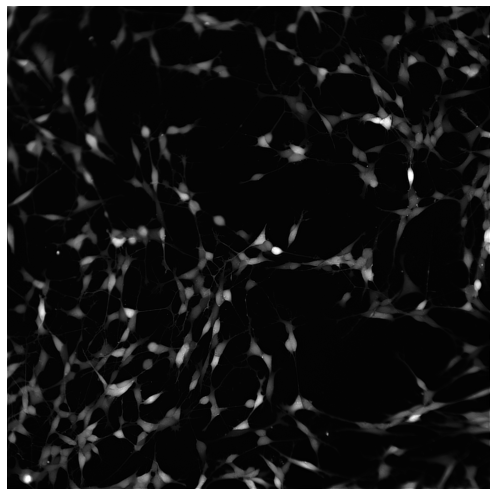

In [10]:
import cv2
import matplotlib.pyplot as plt

# load the image as a single channel graysacle image
fitc_image = cv2.imread(r"assets//B - 02(fld 07 wv FITC - FITC).tif", 0)

# display the image
plt.figure(figsize=(7,7))
plt.imshow(fitc_image, cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

**Segment Neurites in Image**

In [11]:
from src.computer_vision_pipeline.segmentation.neurite_semantic_segmentation import segment_neurites
neurite_mask = segment_neurites(fitc_image, cv_models.neurite_seg_model)

**Display Segmentaion Results**

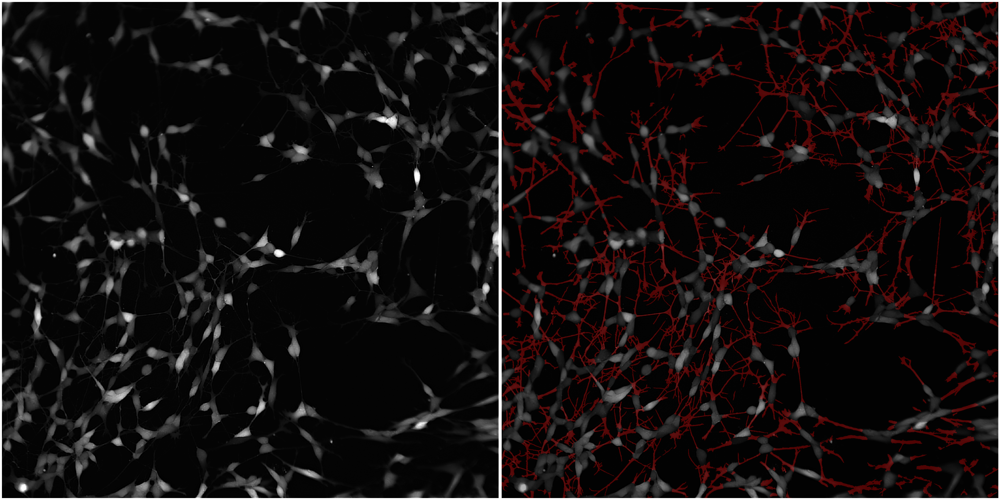

In [12]:
from skimage.color import label2rgb
result_image = label2rgb(neurite_mask, fitc_image, kind='overlay', bg_label=0)
plt.figure(figsize=(50,50))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(fitc_image, 'gray', interpolation='none')
plt.subplot(1,2,2)
plt.imshow(result_image)
plt.axis('off')
plt.tight_layout()
plt.show()

###  **Foreground Segmentation**

Now we'll use a GMM model to segment the cells from the background in the FITC image.

**Segment Foreground**

In [13]:
from src.computer_vision_pipeline.segmentation.foreground_segmentation import segment_foreground
cells_foreground_mask = segment_foreground(fitc_image)

**Display Results**

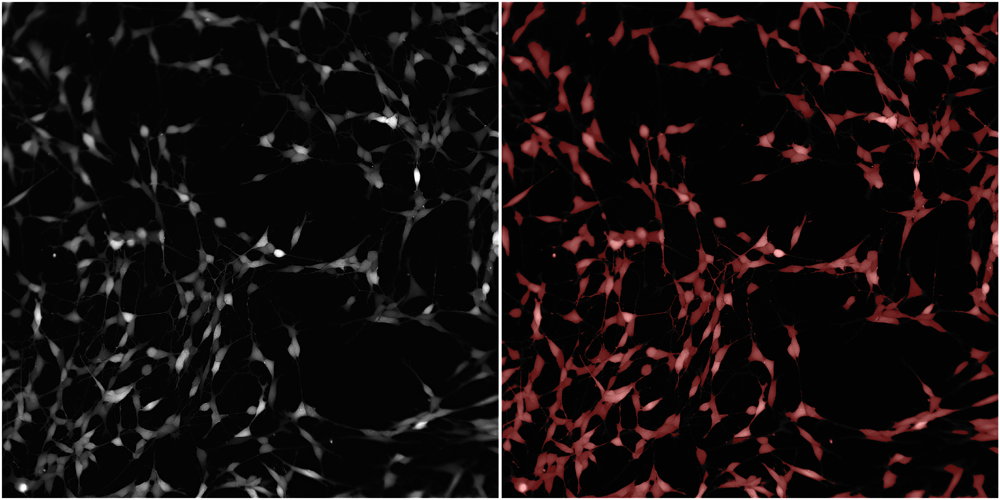

In [14]:
from skimage.color import label2rgb
result_image = label2rgb(cells_foreground_mask, fitc_image, kind='overlay', bg_label=0)
plt.figure(figsize=(50,50))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(fitc_image, 'gray', interpolation='none')
plt.subplot(1,2,2)
plt.imshow(result_image)
plt.axis('off')
plt.tight_layout()
plt.show()

### **Nucleus instance segmentation - Requires GPU**

Let's load the corresponding DAPI image showing the stained nuclei, and perform nucleus instance segmentation - idenfying which pixels belongs to which individual nucleus.

The Mask RCNN model used for instance segmentation is the 3rd place winner of the 2018 Kaggle's Data Science Bowl found in the following repository:
[https://github.com/Lopezurrutia/DSB_2018](https://github.com/Lopezurrutia/DSB_2018)
 and described in the following Nature Methods paper:

Caicedo, J.C., Goodman, A., Karhohs, K.W. et al. Nucleus segmentation across imaging experiments: the 2018 Data Science Bowl. Nat Methods 16, 1247–1253 (2019). https://doi.org/10.1038/s41592-019-0612-7


**Load and Display the DAPI Image**

You can notice the nuclei, nuclear fragments of dead cells (small shiny blobs) and two large backscatter artifacts (large white circles).


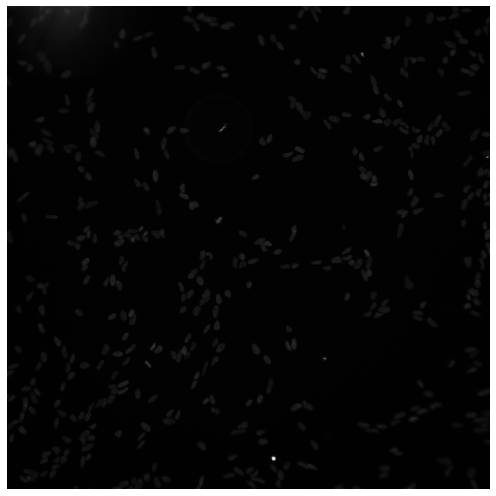

In [15]:
import cv2
import matplotlib.pyplot as plt

# load the image (load as a 3 channel image to use the Mask RCNN model)
dapi_image = cv2.imread(r"assets//B - 02(fld 07 wv DAPI - DAPI).tif")

# display the image
plt.figure(figsize=(7,7))
plt.imshow(dapi_image, cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

**Perform Nuclei Instance Segmentation**

The following function performs nuclei instance segmentation, and then by checking for overlap with the cells forground mask it discards the nuclear fragments and calculates their ratio out of the entire cell population as a measure of toxicity. It also returns each nucleus centroid.

In [16]:
from src.computer_vision_pipeline.segmentation.nuclei_instance_segmentation import segment_nuclei
nuclei_instance_segmentation_mask, centroids, apoptosis_fraction = segment_nuclei(dapi_image, cells_foreground_mask, cv_models.nuclei_maskrcnn)

**Display Results**

Things to notice:
1. Most of the nuclei is segmented perfectly.
2. Most of the nuclear fragments are not mistakenly identified as nuclei.



Valid Nuclei Count is 446 Out of a Total of 459.0 Nuclei Identified with 2.83%  of Nuclear Fragments


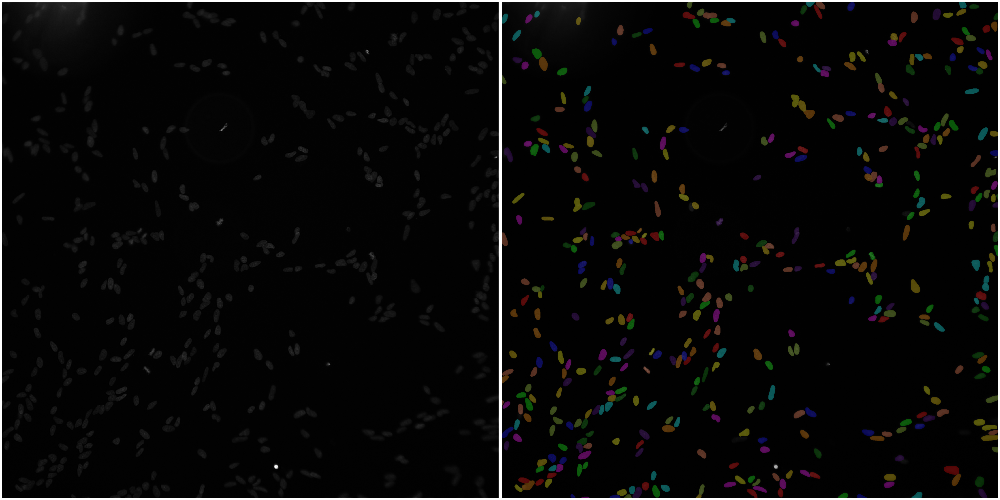

In [17]:
from skimage.color import label2rgb
valid_nuclei_count = len(centroids) - 1
colors = ['red', "coral", 'blue', 'yellow', "gold", 'magenta', 'green', "lime", 'indigo', 'darkorange', 'cyan', 'yellowgreen']
result_image = label2rgb(nuclei_instance_segmentation_mask, dapi_image, kind='overlay', bg_label=0, colors=colors)
plt.figure(figsize=(50,50))       
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(dapi_image, 'gray', interpolation='none')
plt.subplot(1,2,2)
plt.imshow(result_image)
plt.axis('off')
plt.tight_layout()
print("Valid Nuclei Count is {} Out of a Total of {} Nuclei Identified with {}%  of Nuclear Fragments".format(valid_nuclei_count, valid_nuclei_count/(1-apoptosis_fraction), round(apoptosis_fraction*100,2)))
plt.show()

###  **Cell Body Instance Segmentation**

Now we can use the Watershed algorithm to perform cell body instance segmentation using the FITC image, the nuclei as markers and the cell's foreground as a mask to indicate which parts of the image to segment.

In [18]:
from skimage.morphology import watershed
cell_instance_segmentation_mask = watershed(-1*fitc_image, markers=nuclei_instance_segmentation_mask, watershed_line=True, mask=cells_foreground_mask)

/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


**Display Results**

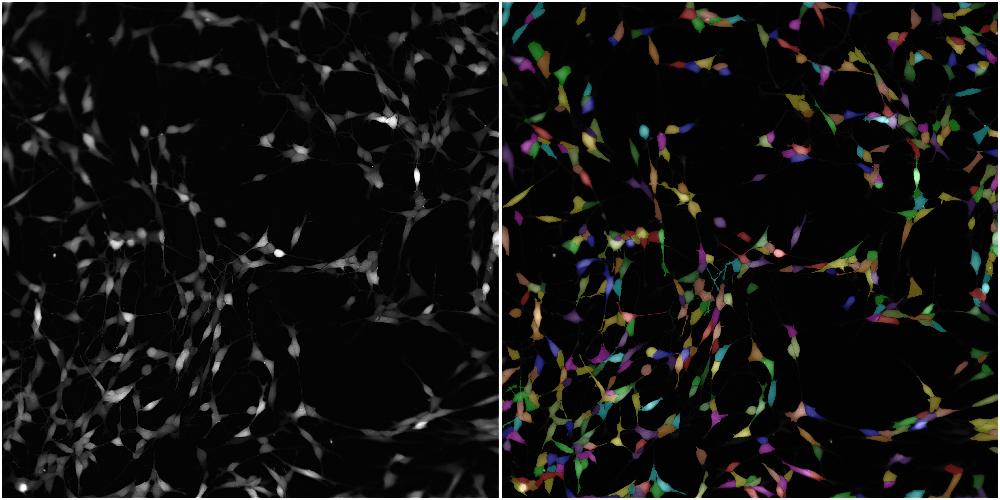

In [19]:
from skimage.color import label2rgb
result_image = label2rgb(cell_instance_segmentation_mask, fitc_image, kind='overlay', bg_label=0, colors=colors)
plt.figure(figsize=(50,50))       
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(fitc_image, 'gray', interpolation='none')
plt.subplot(1,2,2)
plt.imshow(result_image)
plt.axis('off')
plt.tight_layout()
plt.show()

### Graph representation of cell culture

**Create a Graph Representation of the Cell Culture**
 
When the nodes are the cells and two nodes have an edge between them if the corresponding cells have a neurite between them.


In [20]:
from src.computer_vision_pipeline.graph.graph_representation import create_graph
from skan import Skeleton, summarize
from skimage import morphology
import networkx as nx

# skeletonize the (binary) neurite mask
skeletonized_neurite_mask = morphology.skeletonize(neurite_mask)

# initiate a networkx graph and initiate it with the nuclei centroids as nodes with their (x,y) coordinates
graph = nx.Graph()
nodes_dict = {nuc_num: tuple(centroids[nuc_num])[::-1] for nuc_num in range(1, len(centroids))}
graph.add_nodes_from(nodes_dict)

# extract branch-wise information of the connected components of the skeletonized neurite mask
skeleton_branch_data = summarize(Skeleton(skeletonized_neurite_mask))

# create a graph representation of the cells and extract a cell wise neurite length dictionary
graph, neurite_length_dict = create_graph(graph, cell_instance_segmentation_mask, skeleton_branch_data, centroids, config, neurite_mask.shape)


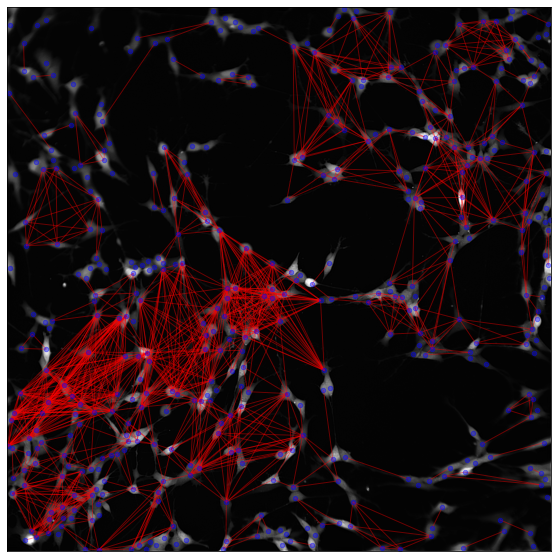

In [23]:
plt.figure(figsize=(10,10))       
nx.draw_networkx(graph, nodes_dict, with_labels=False, node_size=20, node_color="blue", edge_color="red", alpha=0.4)
plt.imshow(fitc_image, cmap="gray")
plt.show()
